### 1. Libraries

In [20]:
import pandas as pd
import numpy as np
from pandas.plotting import scatter_matrix
from sklearn.ensemble import IsolationForest
import matplotlib
from matplotlib import pyplot as plt

### 2. Data Import and Formatting
#### 2.1 Import

In [21]:
beers_data = pd.read_excel("datasets/beers.xlsx")

#### 2.2 Formatting
Usunięcie kolumny 'Description', ponieważ dane typu string zawarte w tej kolumnie nie mogą być łatwo przetłumaczone na dane liczbowe bądź etykiety- wymagałoby to zastosowania algorytmów NLP. <br>

Usunięcie kolumny 'Beer Name (Full)', ponieważ jest ona zlepkiem kolumn 'Name', 'Brewery' i 'Style'- sama w sobie nie dostarcza żadnej nowej informacji. <br>

Ustawienie indeksu na ['Name', 'Brewery', 'Style'], ponieważ chcemy, żeby każdy indeks był unikalny, a dodatkowo chcemy zachować te kolumny do dalszej analizy, np. do problemu klasyfikacji.



In [22]:
beers_data.head()

,Name,Style,Brewery,Beer Name (Full),Description,ABV,Min IBU,Max IBU,Astringency,Body,...,Fruits,Hoppy,Spices,Malty,review_aroma,review_appearance,review_palate,review_taste,review_overall,number_of_reviews
0,Amber,Altbier,Alaskan Brewing Co.,Alaskan Brewing Co. Alaskan Amber,"Notes:Richly malty and long on the palate, wit...",5.3,25,50,13,32,...,33,57,8,111,3.498994,3.636821,3.556338,3.643863,3.847082,497
1,Double Bag,Altbier,Long Trail Brewing Co.,Long Trail Brewing Co. Double Bag,"Notes:This malty, full-bodied double alt is al...",7.2,25,50,12,57,...,24,35,12,84,3.798337,3.846154,3.904366,4.024948,4.034304,481
2,Long Trail Ale,Altbier,Long Trail Brewing Co.,Long Trail Brewing Co. Long Trail Ale,Notes:Long Trail Ale is a full-bodied amber al...,5.0,25,50,14,37,...,10,54,4,62,3.409814,3.667109,3.600796,3.631300,3.830239,377
3,Doppelsticke,Altbier,Uerige Obergärige Hausbrauerei GmbH / Zum Uerige,Uerige Obergärige Hausbrauerei GmbH / Zum Ueri...,Notes:,8.5,25,50,13,55,...,49,40,16,119,4.148098,4.033967,4.150815,4.205163,4.005435,368
4,Sleigh'r Dark Doüble Alt Ale,Altbier,Ninkasi Brewing Company,Ninkasi Brewing Company Sleigh'r Dark Doüble A...,Notes:Called 'Dark Double Alt' on the label.Se...,7.2,25,50,25,51,...,11,51,20,95,3.625000,3.973958,3.734375,3.765625,3.817708,96


In [23]:
beers_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3197 entries, 0 to 3196
Data columns (total 25 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Name               3197 non-null   object 
 1   Style              3197 non-null   object 
 2   Brewery            3197 non-null   object 
 3   Beer Name (Full)   3197 non-null   object 
 4   Description        3197 non-null   object 
 5   ABV                3197 non-null   float64
 6   Min IBU            3197 non-null   int64  
 7   Max IBU            3197 non-null   int64  
 8   Astringency        3197 non-null   int64  
 9   Body               3197 non-null   int64  
 10  Alcohol            3197 non-null   int64  
 11  Bitter             3197 non-null   int64  
 12  Sweet              3197 non-null   int64  
 13  Sour               3197 non-null   int64  
 14  Salty              3197 non-null   int64  
 15  Fruits             3197 non-null   int64  
 16  Hoppy              3197 

In [24]:
beers_data.drop(columns = ['Description'] , inplace=True)

In [25]:
len(beers_data['Name'].unique()) #nie możemy użyć 'Name' jako 
len(beers_data['Beer Name (Full)'].unique()) #ok

3197

In [26]:
beers_data.drop(columns = ['Beer Name (Full)'] , inplace=True)

In [27]:
beers_data[['Name', 'Brewery', 'Style']].drop_duplicates()
beers_data.set_index(['Name', 'Brewery', 'Style'], inplace=True)

In [28]:
beers_data = beers_data[['Bitter', 'Hoppy', 'Body', 'Fruits', 'Alcohol', 'Sour', 'review_aroma']]

### 3. Exploratory Data Analysis
#### 3.1 General

In [29]:
beers_data.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 3197 entries, ('Amber', 'Alaskan Brewing Co.', 'Altbier') to ('Frosted Frog Christmas Ale - Barrel-Aged', "Hoppin' Frog Brewery", 'Winter Warmer')
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Bitter        3197 non-null   int64  
 1   Hoppy         3197 non-null   int64  
 2   Body          3197 non-null   int64  
 3   Fruits        3197 non-null   int64  
 4   Alcohol       3197 non-null   int64  
 5   Sour          3197 non-null   int64  
 6   review_aroma  3197 non-null   float64
dtypes: float64(1), int64(6)
memory usage: 222.8+ KB


In [30]:
beers_data.describe()

,Bitter,Hoppy,Body,Fruits,Alcohol,Sour,review_aroma
count,3197.000000,3197.000000,3197.000000,3197.000000,3197.000000,3197.000000,3197.000000
mean,36.364404,40.924617,46.129496,38.529559,17.055990,33.145449,3.638789
std,25.791152,30.403641,25.947842,32.296646,17.331334,35.780172,0.503209
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.509615
25%,17.000000,18.000000,29.000000,12.000000,6.000000,11.000000,3.422559
50%,31.000000,33.000000,40.000000,29.000000,11.000000,22.000000,3.720183
75%,52.000000,56.000000,58.000000,60.000000,22.000000,42.000000,3.978000
max,150.000000,172.000000,175.000000,175.000000,139.000000,284.000000,5.000000


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002264A396C40>,
      dtype=object)

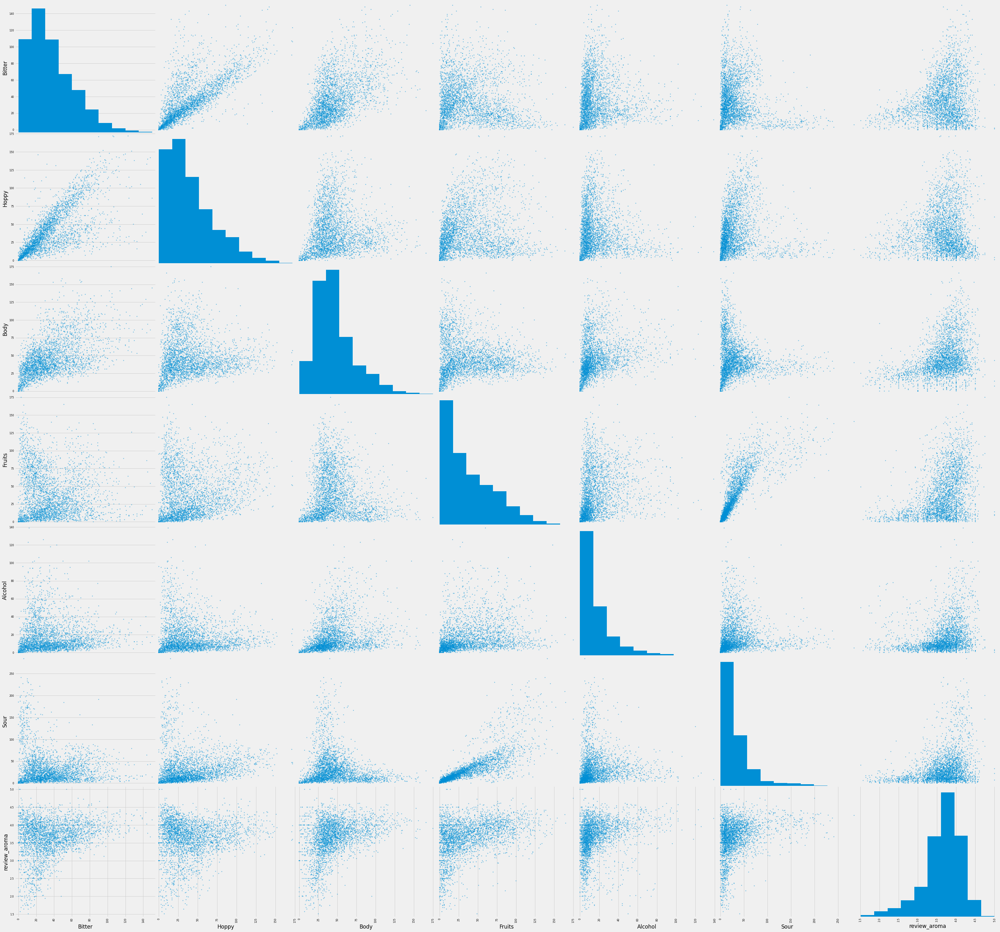

In [31]:
scatter_matrix(beers_data, figsize=(50,50))

#### 3.2 Outliers
Standard univariate method of outlier detection is Z-score filter...

In [32]:
beers_data[beers_data.columns]

,,,Bitter,Hoppy,Body,Fruits,Alcohol,Sour,review_aroma
Name,Brewery,Style,,,,,,,
Amber,Alaskan Brewing Co.,Altbier,47,57,32,33,9,33,3.498994
Double Bag,Long Trail Brewing Co.,Altbier,33,35,57,24,18,16,3.798337
Long Trail Ale,Long Trail Brewing Co.,Altbier,42,54,37,10,6,11,3.409814
Doppelsticke,Uerige Obergärige Hausbrauerei GmbH / Zum Uerige,Altbier,47,40,55,49,31,18,4.148098
Sleigh'r Dark Doüble Alt Ale,Ninkasi Brewing Company,Altbier,44,51,51,11,26,9,3.625000
...,...,...,...,...,...,...,...,...,...
Winter Shredder,Cisco Brewers Inc.,Winter Warmer,35,45,37,23,24,19,4.125000
The First Snow Ale,RJ Rockers Brewing Company,Winter Warmer,16,14,31,54,23,43,3.950000
Red Nose Winter Ale,Natty Greene's Pub & Brewing Co.,Winter Warmer,19,21,44,26,24,21,3.576923


In [33]:
clf = IsolationForest(random_state=0)
beer_data_iso = beers_data[beers_data.columns].to_numpy().astype(float)
clf.fit(beer_data_iso)
beers_data['outlier'] = clf.predict(beer_data_iso)
beers_data[beers_data['outlier'] == -1]

,,,Bitter,Hoppy,Body,Fruits,Alcohol,Sour,review_aroma,outlier
Name,Brewery,Style,,,,,,,,
Olde School Barleywine,Dogfish Head Brewery,Barleywine - American,56,43,55,107,82,30,3.902411,-1
Brewer's Reserve Bourbon Barrel Barleywine,Central Waters Brewing Company,Barleywine - American,40,23,65,63,94,25,4.369205,-1
Old Ruffian,Great Divide Brewing Company,Barleywine - American,107,120,55,57,31,27,4.238552,-1
Behemoth,Three Floyds Brewing Co. & Brewpub,Barleywine - American,90,105,71,101,52,72,4.207373,-1
Lower De Boom Barleywine,21st Amendment Brewery,Barleywine - American,67,98,60,120,47,73,3.714286,-1
...,...,...,...,...,...,...,...,...,...,...
Barrel Aged Brrrbon (Brothers' Reserve Series),Widmer Brothers Brewing Company,Winter Warmer,36,47,59,27,118,12,3.600629,-1
Bourbon Barrel Aged Winter Warmer,Rahr & Sons Brewing Company,Winter Warmer,35,32,69,34,92,24,4.063492,-1
Mogul Madness Ale,Rogue Ales,Winter Warmer,109,124,62,31,43,27,3.743478,-1


In [34]:
import itertools

column_pairs = list(itertools.product(beers_data.columns,beers_data.columns))
column_pairs

[('Bitter', 'Bitter'),
 ('Bitter', 'Hoppy'),
 ('Bitter', 'Body'),
 ('Bitter', 'Fruits'),
 ('Bitter', 'Alcohol'),
 ('Bitter', 'Sour'),
 ('Bitter', 'review_aroma'),
 ('Bitter', 'outlier'),
 ('Hoppy', 'Bitter'),
 ('Hoppy', 'Hoppy'),
 ('Hoppy', 'Body'),
 ('Hoppy', 'Fruits'),
 ('Hoppy', 'Alcohol'),
 ('Hoppy', 'Sour'),
 ('Hoppy', 'review_aroma'),
 ('Hoppy', 'outlier'),
 ('Body', 'Bitter'),
 ('Body', 'Hoppy'),
 ('Body', 'Body'),
 ('Body', 'Fruits'),
 ('Body', 'Alcohol'),
 ('Body', 'Sour'),
 ('Body', 'review_aroma'),
 ('Body', 'outlier'),
 ('Fruits', 'Bitter'),
 ('Fruits', 'Hoppy'),
 ('Fruits', 'Body'),
 ('Fruits', 'Fruits'),
 ('Fruits', 'Alcohol'),
 ('Fruits', 'Sour'),
 ('Fruits', 'review_aroma'),
 ('Fruits', 'outlier'),
 ('Alcohol', 'Bitter'),
 ('Alcohol', 'Hoppy'),
 ('Alcohol', 'Body'),
 ('Alcohol', 'Fruits'),
 ('Alcohol', 'Alcohol'),
 ('Alcohol', 'Sour'),
 ('Alcohol', 'review_aroma'),
 ('Alcohol', 'outlier'),
 ('Sour', 'Bitter'),
 ('Sour', 'Hoppy'),
 ('Sour', 'Body'),
 ('Sour', 'Fruits'),


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002264E5A0EB0>,
      dtype=object)

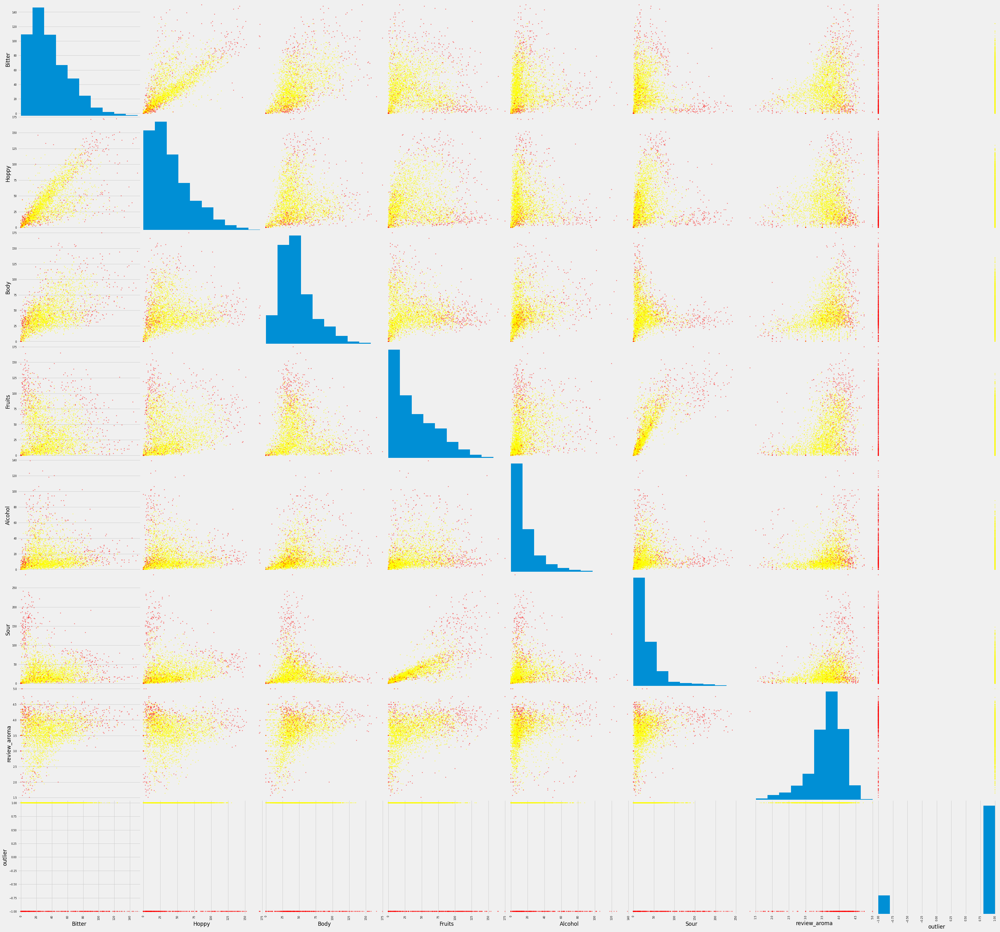

In [35]:
colors={'Red', 'Blue', 'Green', 'Yellow'}
scatter_matrix(beers_data, figsize=(50,50), c=beers_data['outlier'], cmap=matplotlib.colors.ListedColormap(colors))

#### 3.3 Feature Engeenering

### 4. Clusterization


#### 4.1 K-Means

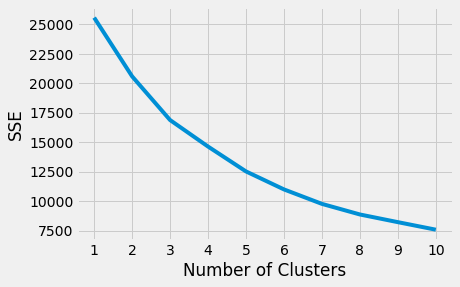

5

In [36]:
import matplotlib.pyplot as plt
from kneed import KneeLocator
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_features = scaler.fit_transform(beers_data)

kmeans_kwargs = {
    "init" : "random",
    "n_init" : 10,
    "max_iter" : 300,
    "random_state" : 42,
}

sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(scaled_features)
    sse.append(kmeans.inertia_)

plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

kl = KneeLocator(
    range(1, 11), sse, curve="convex", direction="decreasing"
)
kl.elbow

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002264F846D30>,
      dtype=object)

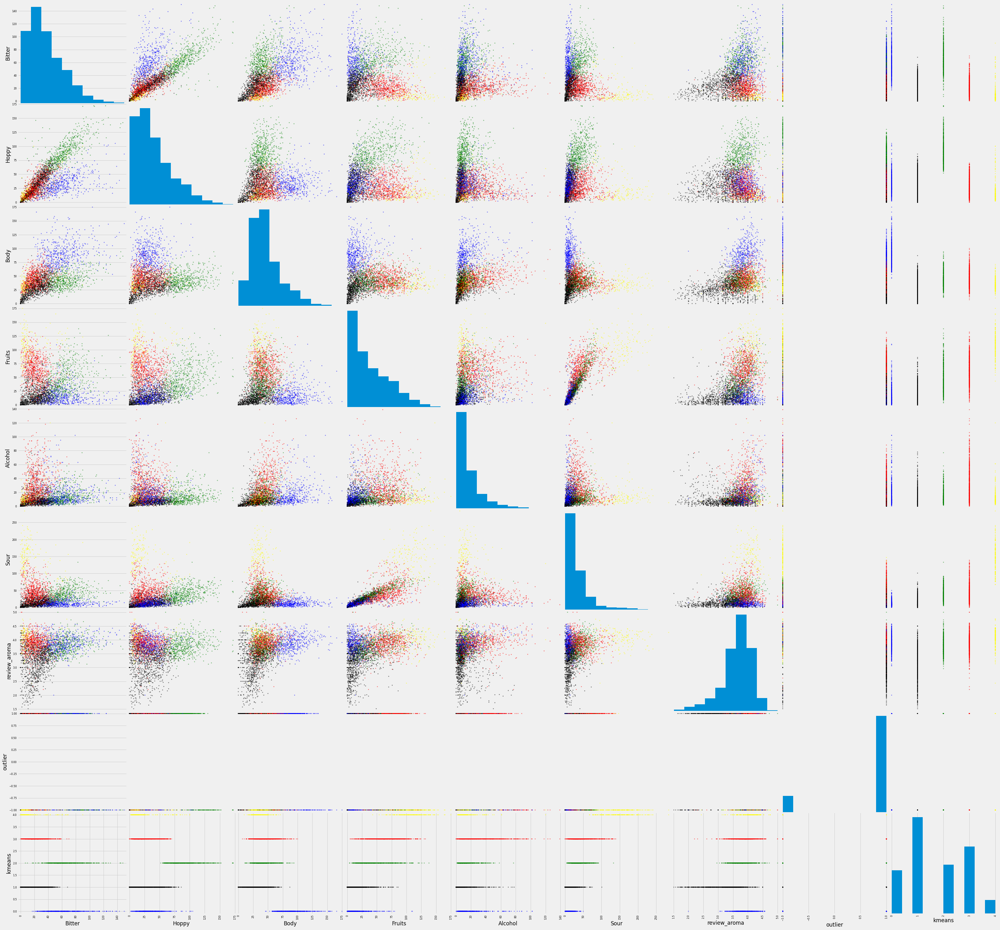

In [37]:
kmeans = KMeans(n_clusters=5, **kmeans_kwargs)
kmeans.fit(scaled_features)
beers_data['kmeans'] = kmeans.predict(scaled_features)

colors = {'Red', 'Green', 'Blue', 'Yellow', 'Black'}
scatter_matrix(beers_data, figsize=(50,50), c=beers_data['kmeans'], cmap=matplotlib.colors.ListedColormap(colors))

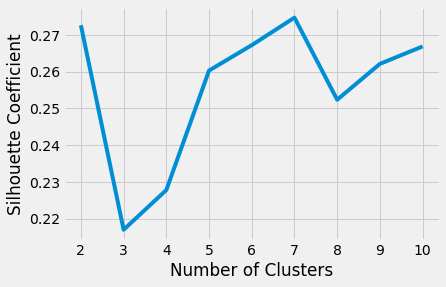

In [38]:
# A list holds the silhouette coefficients for each k
silhouette_coefficients = []
# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(scaled_features)
    score = silhouette_score(scaled_features, kmeans.labels_)
    silhouette_coefficients.append(score)

plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [40]:
style_clusters = beers_data.reset_index()[['Style', 'kmeans']]
style_clusters['count'] = 1
pd.pivot_table(style_clusters, index = ['Style'], columns = ['kmeans'], aggfunc=np.sum).to_excel('kmeans_clusters1.xlsx')

#### 4.2 DBSCAN

In [41]:
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_moons
from sklearn.metrics import adjusted_rand_score

# Instantiate k-means and dbscan algorithms
kmeans = KMeans(n_clusters=4)
dbscan = DBSCAN(eps=0.3)

# Fit the algorithms to the features
kmeans.fit(scaled_features)
dbscan.fit(scaled_features)

# Compute the silhouette scores for each algorithm
kmeans_silhouette = silhouette_score(
    scaled_features, kmeans.labels_
).round(2)
dbscan_silhouette = silhouette_score(
   scaled_features, dbscan.labels_
).round(2)

In [42]:
kmeans_silhouette

0.23

In [43]:
dbscan_silhouette

-0.34

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000022602A9F3A0>,
      dtype=object)

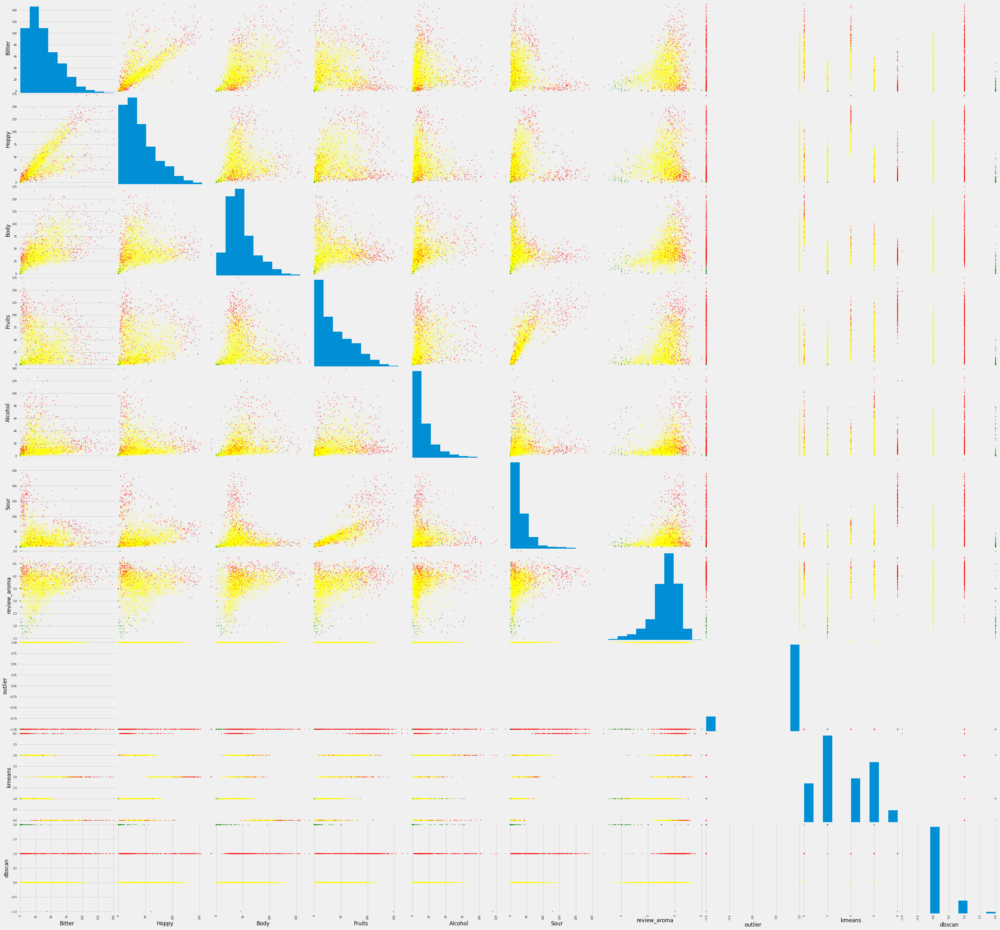

In [50]:
dbscan = DBSCAN(eps=2.5)
beers_data['dbscan'] = dbscan.fit_predict(scaled_features)

colors = ['black', 'yellow', 'blue', 'red', 'green']
scatter_matrix(beers_data, figsize=(50,50), c=beers_data['dbscan'], cmap=matplotlib.colors.ListedColormap(colors))



### 5. Classification